# Carga de Datos

In [1]:
import pandas as pd
import os

data_path = '../../Data/Used Cars/'

bmw = pd.read_csv(data_path+'bmw.csv')
toyota = pd.read_csv(data_path+'toyota.csv')
audi = pd.read_csv(data_path+'audi.csv')

In [2]:
# Carga del modelo de SKleanr. 
from sklearn.linear_model import LinearRegression

reg = LinearRegression().fit(X, y)

help(LinearRegression)

In [3]:
bmw['ag'] = 2022 - bmw['year']

toyota['ag'] = 2022 - toyota['year']

audi['ag'] = 2022 - audi['year']

In [4]:
bmw.head(3)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag
0,5 Series,2014,11200,Automatic,67068,Diesel,125,57.6,2.0,8
1,6 Series,2018,27000,Automatic,14827,Petrol,145,42.8,2.0,4
2,5 Series,2016,16000,Automatic,62794,Diesel,160,51.4,3.0,6


In [5]:
bmw['fuelType'].unique()

array(['Diesel', 'Petrol', 'Other', 'Hybrid', 'Electric'], dtype=object)

In [6]:
bmw['transmission'].unique()

array(['Automatic', 'Manual', 'Semi-Auto'], dtype=object)

In [7]:
bmw['engineSize'].unique()

array([2. , 3. , 1.5, 0.6, 1.6, 4.4, 0. , 2.2, 2.5, 4. , 3.2, 1. , 5. ,
       1.9, 6.6, 2.8, 3.5])

## Nota:
* X: es la antigüedad y las millas
* y: el precio

## Ejemplo regresión básica:
* $y = \beta_0 + \beta_1 x + \epsilon$
* con x = millas
* y = precio

In [8]:
from sklearn.linear_model import LinearRegression
import plotly.express as px
import seaborn as sns
import numpy as np


def linear_analysis(df, cols, tar, plot=True, intercept=True, res_plot=True):
    
    X = df[cols].copy()
    y = df[[tar]].copy()
    
    if intercept: lr = LinearRegression()
    else: lr = LinearRegression(fit_intercept=False)
    lr.fit(X,y)
    coef_l = [(c,j) for c,j in zip(cols,lr.coef_[0])]
    print(f'Los coeficientes de su modelo son: {coef_l}')
    if intercept: print(f'El intercepto de su modelo es: {lr.intercept_}')
        
    if plot: print(sns.lmplot(data=df, x=cols[0], y=tar, fit_reg=False))
    
    df2 = df.copy()
    df2['predictions'] = lr.predict(X)
    df2['residuals'] = df2[tar]-df2['predictions']
    
    if res_plot:
        mean = df2['residuals'].mean()
        median = df2['residuals'].median()
        std = df2['residuals'].std()
        print(f'Residuals mean value is: {mean}.')
        print(f'Residuals median value is: {median}.')
        print(f'Residuals std value is: {std}.')
        fig = px.histogram(df2, x='residuals', marginal='box')
        fig.show()
    
    return(lr, df2)

Los coeficientes de su modelo son: [('mileage', -0.13878235071677), ('ag', -1880.9197391539449)]
El intercepto de su modelo es: [35528.06858534]
Residuals mean value is: 1.727710925916851e-12.
Residuals median value is: -1893.9556627617822.
Residuals std value is: 8645.125213092333.


Por cada Milla recorrida se pierde un total de: -0.13878235071677 dólar.
Por cada año de antigüedad se pierde un total de: -1880.9197391539449 dólar.
Y se pierde un dólar por cada: -7.2055271786022805 milla.
Y se pierde un dólar por cada: -0.0005316547958871489 año.


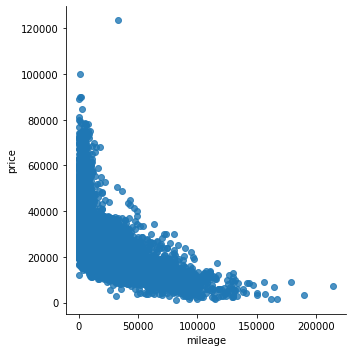

In [9]:
lrbmw, dfbmw = linear_analysis(bmw, ['mileage', 'ag'], 'price')
print(f'Por cada Milla recorrida se pierde un total de: {lrbmw.coef_[0][0]} dólar.')
print(f'Por cada año de antigüedad se pierde un total de: {lrbmw.coef_[0][1]} dólar.')
print(f'Y se pierde un dólar por cada: {1/lrbmw.coef_[0][0]} milla.')
print(f'Y se pierde un dólar por cada: {1/lrbmw.coef_[0][1]} año.')

Los coeficientes de su modelo son: [('mileage', 0.005936504690044519), ('ag', -1249.3397488144008)]
El intercepto de su modelo es: [18948.04931443]
Residuals mean value is: 1.2094200842810088e-12.
Residuals median value is: -1760.9517462021304.
Residuals std value is: 5754.908429527073.


Por cada Milla recorrida se pierde un total de: 0.005936504690044519 dólar.
Por cada año de antigüedad se pierde un total de: -1249.3397488144008 dólar.
Y se pierde un dólar por cada: 168.44928997984178 milla.
Y se pierde un dólar por cada: -0.0008004227840737322 año.


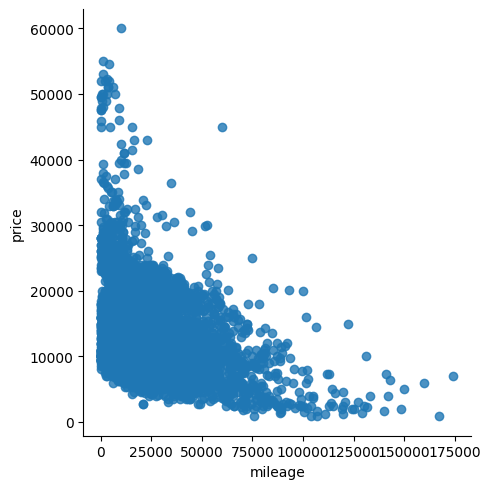

In [10]:
lrtoyota, dftoyota = linear_analysis(toyota, ['mileage', 'ag'], 'price')
print(f'Por cada Milla recorrida se pierde un total de: {lrtoyota.coef_[0][0]} dólar.')
print(f'Por cada año de antigüedad se pierde un total de: {lrtoyota.coef_[0][1]} dólar.')
print(f'Y se pierde un dólar por cada: {1/lrtoyota.coef_[0][0]} milla.')
print(f'Y se pierde un dólar por cada: {1/lrtoyota.coef_[0][1]} año.')

Los coeficientes de su modelo son: [('mileage', -0.08925834077455566), ('ag', -2438.413045254491)]
El intercepto de su modelo es: [37059.30184354]
Residuals mean value is: -4.365028939892569e-13.
Residuals median value is: -2057.8959694004025.
Residuals std value is: 9348.221287543813.


Por cada Milla recorrida se pierde un total de: -0.08925834077455566 dólar.
Por cada año de antigüedad se pierde un total de: -2438.413045254491 dólar.
Y se pierde un dólar por cada: -11.20343478628794 milla.
Y se pierde un dólar por cada: -0.0004101027928578985 año.


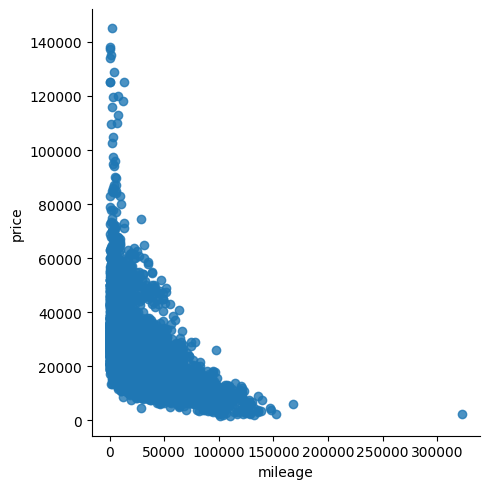

In [11]:
lraudi, dfaudi = linear_analysis(audi, ['mileage', 'ag'], 'price')
print(f'Por cada Milla recorrida se pierde un total de: {lraudi.coef_[0][0]} dólar.')
print(f'Por cada año de antigüedad se pierde un total de: {lraudi.coef_[0][1]} dólar.')
print(f'Y se pierde un dólar por cada: {1/lraudi.coef_[0][0]} milla.')
print(f'Y se pierde un dólar por cada: {1/lraudi.coef_[0][1]} año.')

In [12]:
import plotly.express as px


fig = px.scatter(bmw, x="mileage", y="price", trendline="ols")
fig.show()

In [13]:
dfbmw.head(2)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag,predictions,residuals
0,5 Series,2014,11200,Automatic,67068,Diesel,125,57.6,2.0,8,11172.855974,27.144026
1,6 Series,2018,27000,Automatic,14827,Petrol,145,42.8,2.0,4,25946.663715,1053.336285


In [14]:
dfbmw.sort_values(by='ag', ascending=True)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag,predictions,residuals
4376,X2,2020,34360,Semi-Auto,835,Petrol,145,38.7,2.0,2,31650.345844,2709.654156
3274,5 Series,2020,28990,Semi-Auto,103,Petrol,145,50.4,2.0,2,31751.934525,-2761.934525
7899,2 Series,2020,25000,Automatic,101,Petrol,145,47.9,2.0,2,31752.212090,-6752.212090
6965,X3,2020,52991,Semi-Auto,4360,Hybrid,135,5.5,2.0,2,31161.138058,21829.861942
7898,3 Series,2020,37250,Automatic,101,Diesel,145,47.9,3.0,2,31752.212090,5497.787910
...,...,...,...,...,...,...,...,...,...,...,...,...
9744,3 Series,1999,1200,Automatic,82000,Petrol,245,31.0,2.8,23,-19113.238174,20313.238174
9555,Z3,1999,3995,Manual,74282,Petrol,245,35.3,1.9,23,-18042.115991,22037.115991
9842,Z3,1998,3950,Manual,56500,Petrol,270,35.3,1.9,24,-17455.207970,21405.207970
9841,Z3,1997,3950,Manual,49000,Petrol,270,35.3,1.9,25,-18295.260079,22245.260079


In [15]:
fig = px.scatter(bmw, x="ag", y="price", trendline="ols")
fig.show()

# Validación de supuestos

* 1. Linealidad
* 2. Homocedasticidad
* 3. Independencia
* 4. Normalidad

In [16]:
toyota.head(2)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0,6
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0,5


## 1. Linealidad

In [17]:
fig = px.scatter(toyota, x="mileage", y="price")
fig.show()

In [20]:
df = toyota.copy()
var_ = '1/price'
df[var_] = 1/df['price']


fig = px.scatter(df, x='mileage', y=var_, trendline="ols")
fig.show()

### Para estimar y, tendríamos que realizar el proceso de estimar 1/y y después realizar la transformación correspondiente.

y=1/precio, precio*y=1, precio=1/y

## 2. Homocedeasticidad

<AxesSubplot:xlabel='ln_mileage', ylabel='1/price'>

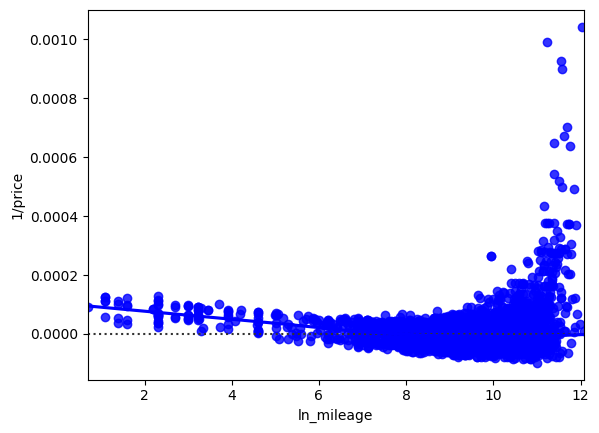

In [24]:
import seaborn as sns
import numpy as np
var2 = 'ln_mileage'
df[var2] = df['mileage'].map(np.log)

X = df[[var2]].copy()

y = df[[var_]].copy()

sns.residplot(x=X, y=y, lowess=True, color='b')

## 3. Independencia

<AxesSubplot:xlabel='mileage', ylabel='1/price'>

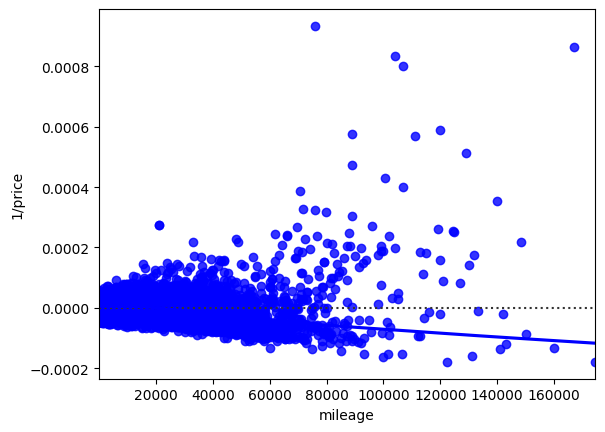

In [27]:
X=df[['mileage']].copy()
y=df[[var_]].copy()
sns.residplot(x=X, y=y, lowess=True, color='b')

<AxesSubplot:>

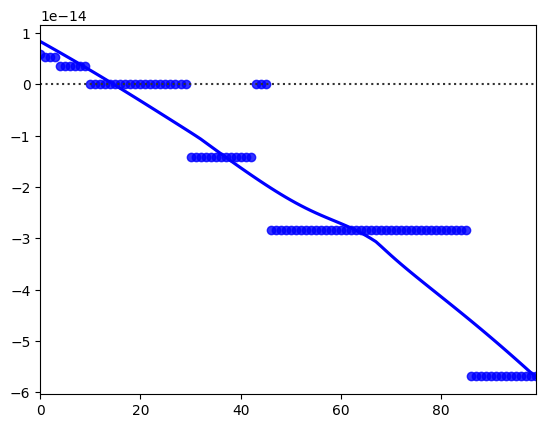

In [37]:
X=[i for i in range(100)]
y=[x*3 for x in X]
sns.residplot(x=X, y=y, lowess=True, color='b')

In [38]:
df3 = pd.DataFrame()
df3['X'] = X
df3['y'] = y
fig = px.scatter(df3, x='X', y='y', trendline="ols")
fig.show()

### Validación estadística por Durbin-Watson

In [32]:
df.head(2)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag,1/price,ln_mileage
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0,6,0.000063,10.089511
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0,5,0.000063,9.831723


In [35]:
from statsmodels.formula.api import ols

#fit multiple linear regression model
model = ols('price ~ mileage + ag', data=df).fit()

#view model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.177
Model:                            OLS   Adj. R-squared:                  0.177
Method:                 Least Squares   F-statistic:                     726.0
Date:                Sat, 18 Jun 2022   Prob (F-statistic):          2.98e-286
Time:                        11:28:18   Log-Likelihood:                -67897.
No. Observations:                6738   AIC:                         1.358e+05
Df Residuals:                    6735   BIC:                         1.358e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.895e+04    189.403    100.041      0.0

In [39]:
#fit multiple linear regression model
model = ols('y ~ X', data=df3).fit()

#view model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 9.144e+32
Date:                Sat, 18 Jun 2022   Prob (F-statistic):               0.00
Time:                        11:32:18   Log-Likelihood:                 2977.5
No. Observations:                 100   AIC:                            -5951.
Df Residuals:                      98   BIC:                            -5946.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -5.995e-15   5.68e-15     -1.055      0.2

## 4. Normalidad

eval_env: 1


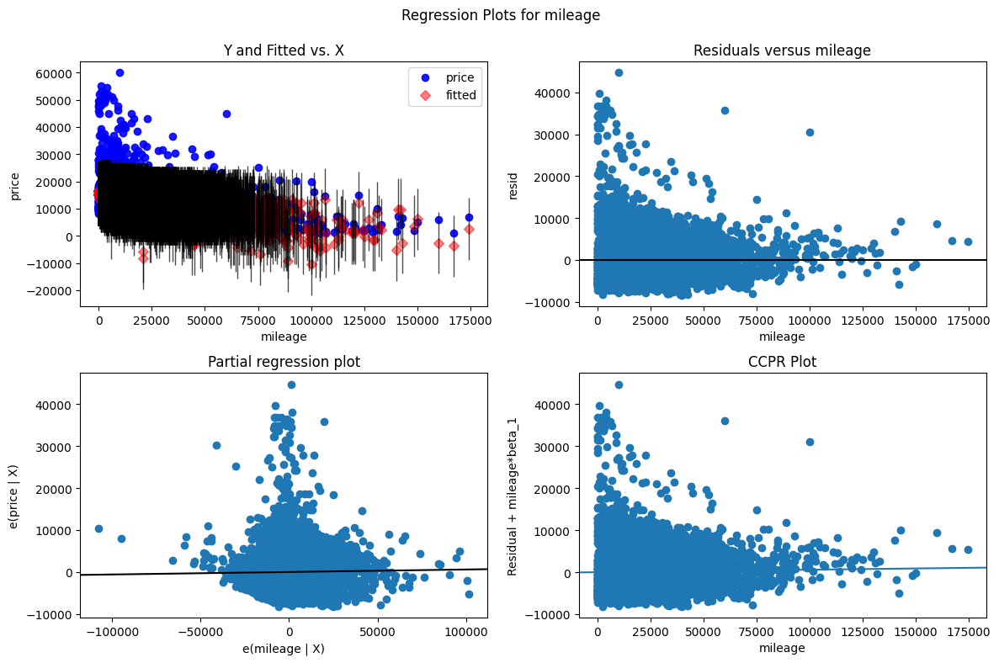

In [42]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols

lr = ols('price ~ mileage + ag', data=df).fit()

fig = plt.figure(figsize=(12, 8))

fig = sm.graphics.plot_regress_exog(lr, 'mileage', fig=fig)

Repositorio: https://robert-alvarez.github.io/2018-06-04-diagnostic_plots/

# Modelos Lineales:

* 1. Regresión Lineal
* 2. Regresión LASSO
* 3. Regresión LARS
* 4. Regresión Cresta
* 5. Regresión de Red Elástica
* 6. Regresión Bayesiana
* 7. Regresión Logistica

In [62]:
X = df[['mileage', 'ag']].copy()
y = df[['price']].copy()
df.head(3)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag,1/price,ln_mileage
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0,6,0.000063,10.089511
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0,5,0.000063,9.831723
2,GT86,2015,13998,Manual,27469,Petrol,265,36.2,2.0,7,0.000071,10.220813


## 2. LASSO

In [63]:
from sklearn.linear_model import Lasso


lasso = Lasso(alpha=.5)
lasso.fit(X,y)

lasso.coef_

array([ 5.91814775e-03, -1.24912089e+03])

In [71]:
df['lasso_residuals'] = df['price'] - pd.Series(lasso.predict(X))

df[['lasso_residuals']].describe(percentiles=[i/10 for i in range(11)])

,lasso_residuals
count,6.738000e+03
mean,-1.105756e-12
std,5.754908e+03
min,-8.397562e+03
0%,-8.397562e+03
10%,-5.533605e+03
20%,-4.638398e+03
30%,-3.726043e+03
40%,-2.917857e+03
50%,-1.761171e+03


## 2. LARS

In [72]:
from sklearn.linear_model import Lars


lars = Lars()
lars.fit(X,y)

lars.coef_

/Users/rolandooviedo/Documents/Diplomado Ciencia de Datos/mod2/mod2/lib/python3.9/site-packages/sklearn/linear_model/_base.py:133: FutureWarning:

The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Lars())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)





array([ 5.93650469e-03, -1.24933975e+03])

In [73]:
df['lars_residuals'] = df['price'] - pd.Series(lars.predict(X))

df[['lars_residuals']].describe(percentiles=[i/10 for i in range(11)])

,lars_residuals
count,6.738000e+03
mean,1.624078e-12
std,5.754908e+03
min,-8.398151e+03
0%,-8.398151e+03
10%,-5.533753e+03
20%,-4.638465e+03
30%,-3.725988e+03
40%,-2.918112e+03
50%,-1.760952e+03


## Ridge

In [75]:
from sklearn.linear_model import Ridge


ridge = Ridge(alpha=.5)
ridge.fit(X,y)

ridge.coef_

array([[ 5.93310166e-03, -1.24929917e+03]])

In [80]:
df['ridge_residuals'] = df['price'] - pd.Series([x[0] for x in ridge.predict(X)])

df[['ridge_residuals']].describe(percentiles=[i/10 for i in range(11)])

,ridge_residuals
count,6.738000e+03
mean,-8.984263e-13
std,5.754908e+03
min,-8.398041e+03
0%,-8.398041e+03
10%,-5.533726e+03
20%,-4.638452e+03
30%,-3.726006e+03
40%,-2.918065e+03
50%,-1.760992e+03


## Elastic Net

In [84]:
from sklearn.linear_model import ElasticNet


elsnet = ElasticNet(alpha=.5)
elsnet.fit(X,y)

elsnet.coef_

array([-4.40613926e-03, -1.12601848e+03])

In [85]:
df['elsnet_residuals'] = df['price'] - pd.Series(elsnet.predict(X))

df[['elsnet_residuals']].describe(percentiles=[i/10 for i in range(11)])

,elsnet_residuals
count,6.738000e+03
mean,2.557060e-12
std,5.757927e+03
min,-8.147671e+03
0%,-8.147671e+03
10%,-5.486515e+03
20%,-4.654663e+03
30%,-3.709257e+03
40%,-2.923088e+03
50%,-1.813249e+03


## Comparación de los residuales dado cada modelo:

In [86]:
vars_ = [c+'_residuals' for c in ['lasso', 'ridge', 'elsnet', 'lars']]

df[vars_].describe(percentiles=[i/10 for i in range(11)])

,lasso_residuals,ridge_residuals,elsnet_residuals,lars_residuals
count,6.738000e+03,6.738000e+03,6.738000e+03,6.738000e+03
mean,-1.105756e-12,-8.984263e-13,2.557060e-12,1.624078e-12
std,5.754908e+03,5.754908e+03,5.757927e+03,5.754908e+03
min,-8.397562e+03,-8.398041e+03,-8.147671e+03,-8.398151e+03
0%,-8.397562e+03,-8.398041e+03,-8.147671e+03,-8.398151e+03
10%,-5.533605e+03,-5.533726e+03,-5.486515e+03,-5.533753e+03
20%,-4.638398e+03,-4.638452e+03,-4.654663e+03,-4.638465e+03
30%,-3.726043e+03,-3.726006e+03,-3.709257e+03,-3.725988e+03
40%,-2.917857e+03,-2.918065e+03,-2.923088e+03,-2.918112e+03
50%,-1.761171e+03,-1.760992e+03,-1.813249e+03,-1.760952e+03


## Regresión Logística

In [106]:
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
import os

toyota.head(3)

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag,tar
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0,6,0
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0,5,0
2,GT86,2015,13998,Manual,27469,Petrol,265,36.2,2.0,7,0


In [108]:
help(LogisticRegressionCV)

Help on class LogisticRegressionCV in module sklearn.linear_model._logistic:

class LogisticRegressionCV(LogisticRegression, sklearn.linear_model._base.LinearClassifierMixin, sklearn.base.BaseEstimator)
 |  LogisticRegressionCV(*, Cs=10, fit_intercept=True, cv=None, dual=False, penalty='l2', scoring=None, solver='lbfgs', tol=0.0001, max_iter=100, class_weight=None, n_jobs=None, verbose=0, refit=True, intercept_scaling=1.0, multi_class='auto', random_state=None, l1_ratios=None)
 |  
 |  Logistic Regression CV (aka logit, MaxEnt) classifier.
 |  
 |  See glossary entry for :term:`cross-validation estimator`.
 |  
 |  This class implements logistic regression using liblinear, newton-cg, sag
 |  of lbfgs optimizer. The newton-cg, sag and lbfgs solvers support only L2
 |  regularization with primal formulation. The liblinear solver supports both
 |  L1 and L2 regularization, with a dual formulation only for the L2 penalty.
 |  Elastic-Net penalty is only supported by the saga solver.
 |  
 

In [107]:
help(LogisticRegression)

Help on class LogisticRegression in module sklearn.linear_model._logistic:

class LogisticRegression(sklearn.linear_model._base.LinearClassifierMixin, sklearn.linear_model._base.SparseCoefMixin, sklearn.base.BaseEstimator)
 |  LogisticRegression(penalty='l2', *, dual=False, tol=0.0001, C=1.0, fit_intercept=True, intercept_scaling=1, class_weight=None, random_state=None, solver='lbfgs', max_iter=100, multi_class='auto', verbose=0, warm_start=False, n_jobs=None, l1_ratio=None)
 |  
 |  Logistic Regression (aka logit, MaxEnt) classifier.
 |  
 |  In the multiclass case, the training algorithm uses the one-vs-rest (OvR)
 |  scheme if the 'multi_class' option is set to 'ovr', and uses the
 |  cross-entropy loss if the 'multi_class' option is set to 'multinomial'.
 |  (Currently the 'multinomial' option is supported only by the 'lbfgs',
 |  'sag', 'saga' and 'newton-cg' solvers.)
 |  
 |  This class implements regularized logistic regression using the
 |  'liblinear' library, 'newton-cg', 's

In [89]:
toyota['fuelType'].unique()

array(['Petrol', 'Other', 'Hybrid', 'Diesel'], dtype=object)

In [93]:
toyota['fuelType'].value_counts(1, dropna=False)

Petrol    0.606560
Hybrid    0.303206
Diesel    0.074651
Other     0.015583
Name: fuelType, dtype: float64

In [94]:
toyota['tar'] = np.where(toyota['fuelType']=='Hybrid', 1, 0)
toyota.head()

,model,year,price,transmission,mileage,fuelType,tax,mpg,engineSize,ag,tar
0,GT86,2016,16000,Manual,24089,Petrol,265,36.2,2.0,6,0
1,GT86,2017,15995,Manual,18615,Petrol,145,36.2,2.0,5,0
2,GT86,2015,13998,Manual,27469,Petrol,265,36.2,2.0,7,0
3,GT86,2017,18998,Manual,14736,Petrol,150,36.2,2.0,5,0
4,GT86,2017,17498,Manual,36284,Petrol,145,36.2,2.0,5,0


In [95]:
toyota['tar'].cumsum()

0          0
1          0
2          0
3          0
4          0
        ... 
6733    2043
6734    2043
6735    2043
6736    2043
6737    2043
Name: tar, Length: 6738, dtype: int64

In [110]:
log_reg = LogisticRegressionCV()
X = toyota[['price', 'mileage', 'mpg']].copy()
y = toyota['tar'].copy()

log_reg.fit(X,y)

LogisticRegressionCV()

In [98]:
log_reg.predict(X)

array([0, 0, 0, ..., 0, 0, 0])

In [99]:
log_reg.predict_proba(X)

array([[0.95099056, 0.04900944],
       [0.95509079, 0.04490921],
       [0.96552451, 0.03447549],
       ...,
       [0.93978495, 0.06021505],
       [0.96919997, 0.03080003],
       [0.97343192, 0.02656808]])

In [100]:
from sklearn.metrics import accuracy_score

In [102]:
accuracy_score(y, log_reg.predict(X))

0.9612644701691897

In [104]:
pd.Series(log_reg.predict(X)).unique()

array([0, 1])